#**Taller 1**
## **Aplicaciones computacionales a problemas físicos 2024-2**

Alexandra Serrano Mendoza - 2201453


## Librerias a usar

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.animation import FuncAnimation

# 1. Ecuación de difusión
 Considere la ecuacion de difusion en 1-D:

  $$ \frac{\partial u}{\partial t} = D \frac{\partial ^2 u}{\partial x^2} $$

Donde x ∈ (0, 1) Con las condiciones de frontera:

u(0, t) = u(1, t) = 0 (0-2)

y la condicion inicial

$$ u(x,0) =sen(\pi x) + 0.1 sen(\pi x) $$

## ¿Qué representa la ecuación de difusión

La ecuación de difusión describe cómo una cantidad física puede dispersarse en un medio, se distribuye y se propaga con el tiempo, en función de las diferencias de concentración o la cantidad en el espacio.

En la ecuación anterior, tenemos que

* u(x,t) es la cantidad que se dispersa, que puede ser la temperatura o la cantidad de sustancia. Esta depende del espacio y del tiempo (al trabajarla en 1-D, solo depende de x y de t).
* D es el coeficiente de difusión, que indica la rapidez con la que la difusión ocurre en cierto medio. Es una constante que depende de las propiedades del material o del medio.
* Adicionalmente, la derivada de u(x,t) representa el cambio temporal de la cantidad difundida, y la segunda derivada espacial de u corresponde a la medida de la curvatura de la distribución en el espacio.



## Diferencias Finitas

Para discretizar la ecuación, aplicamos el esquema de diferencias finitas de segundo orden para las componentes espaciales y temporales.

  ### Componente espacial
 La segunda derivada espacial $ \frac{\partial ^2 u}{\partial x^2} $ se puede aproximar usando el esquema centrado:

 $$\frac{\partial ^2 u}{\partial x^2} = \frac{u_{i+1}^n -2u_i^n +u_{u-1}^n}{(\Delta x)^2}$$

  ### Componente temporal
 La derivada temporal se puede aproximar con diferencias finitas en dirección positiva:
 $$\frac {\partial u}{ \partial t} = \frac{u_i^{n+1}-u_i^n}{\Delta t}$$

 Ahora, reemplazando ambas expresiones en la ecuación original, tenemos:
 $$ \frac{u_i^{n+1}-u_i^n}{\Delta t} = D \frac{u_{i+1}^n -2u_i^n +u_{u-1}^n}{\Delta x^2} $$

 Despejando para $u_i^{n+1}$, tenemos:
 $$ u_i^{n+1} = u_i^n + \frac{D \Delta t}{\Delta x^2} (u_{i+1}^n -2u_i^n +u_{u-1}^n) $$

 Con esto, tenemos el esquema de diferencias finitas para ver el comportamiento de u en cada paso de tiempo.

## Estabilidad
Para garantizar la estabilidad del esquema de diferencias finitas, hacemos un análisis de Von Neumann. Que permite obtener una condición de estabilidad  entre $\Delta t$ y $\Delta x$, tal que:

$$ \frac{D \Delta t}{(\Delta x )^2} $$



## El código

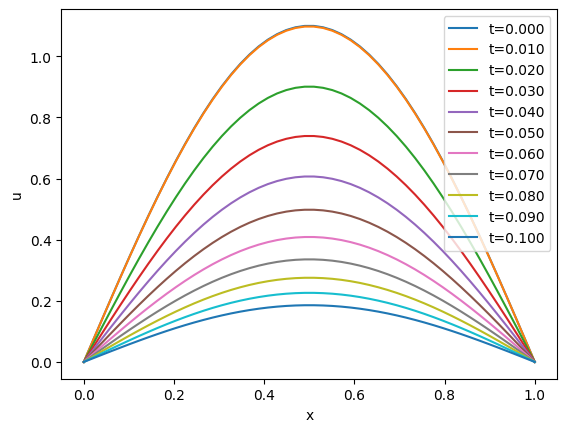

In [37]:

# Parámetros
D = 2.0 # Coeficiente de difusión
L = 1.0
nx = 50  # Número de puntos en el espacio
dx = L / (nx - 1)
dt = 0.0001  # Asegurarse de cumplir la condición CFL
nt = 1000  # Número de pasos de tiempo

# Discretización espacial
x = np.linspace(0, L, nx)

# Condición inicial
u = np.sin(np.pi * x) + 0.1 * np.sin(np.pi * x)

# Guardar resultados en cada paso de tiempo
u_hist = [u.copy()]

# Iterar sobre el tiempo
for n in range(nt):
    u_new = u.copy()
    for i in range(1, nx-1):  # Evitar las condiciones de frontera
        u_new[i] = u[i] + (D * dt / dx**2) * (u[i+1] - 2*u[i] + u[i-1])
    u = u_new
    if n % 100 == 0:  # Guardar cada 100 pasos
        u_hist.append(u.copy())

# Graficar los resultados
for i, u_t in enumerate(u_hist):
    plt.plot(x, u_t, label=f't={i*dt*100:.3f}')
plt.xlabel('x')
plt.ylabel('u')
plt.legend()
plt.show()


# 2. Propagación de Ondas


## Parte 1: Onda Acustica 2D
Construya una aproximación de diferencias finitas para las segundas derivadas espaciales que utilice cinco puntos: i, i+1, i+2, i-1, i-2 y j, j+1, j+2, j-1, j-2. ¿De qué orden seria el error en esta aproximación? ¿De que orden es la aproximación de la solución desarrollada en clase?


  $$ \frac{\partial^2 u}{\partial t^2} = c^2 (\frac{\partial ^2 u}{\partial x^2}+ \frac{\partial ^2 u}{\partial y^2}) $$

  Haciendo la aproximación de diferencias finitas para la segunda derivada espacial, tenemos:

  $$\frac{ \partial^2 u}{\partial x^2} = \frac {u_{i-2,j}-4u_{i-1,j}+6u_{i,j}-4u_{i+1,j}+u_{i+2,j}}{h^2} $$

  $$\frac{ \partial^2 u}{\partial y^2} = \frac {u_{i,j-2}-4u_{i,j-1}+6u_{i,j}-4u_{i,j+1}+u_{i,j+2}}{h^2} $$

donde h es el tamaño del paso en la dirección espacial. Ahora, la aproximación total de la segunda derivada espacial en 2D será:

$$\frac{ \partial^2 u}{\partial x^2} + \frac{ \partial^2 u}{\partial y^2} = \frac {u_{i-2,j}-4u_{i-1,j}+6u_{i,j}-4u_{i+1,j}+u_{i+2,j}}{h^2}+ \frac {u_{i,j-2}-4u_{i,j-1}+6u_{i,j}-4u_{i,j+1}+u_{i,j+2}}{h^2} $$

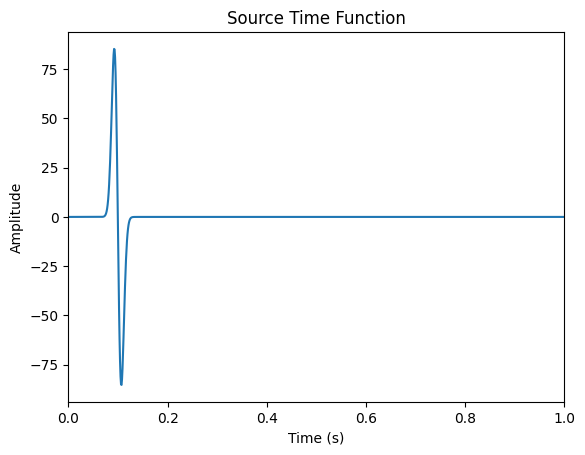

In [38]:
# Aplicando diferencias finitas propagacion de ondas 2-D con 5 puntos

nx = 200   #  Número de puntos en x
nz = 200   #  Número de puntos en z
nt = 1000  # Número de pasos de tiempo
dx = 10.0
dt = 0.001 # Segundos
c0 = 3000  # Velocidad medio m/s

# Caracterización de la fuente

isx = nx // 2 # indice en x
isz = nz // 2 # indice z
ist = 100 # shift funcion de tiempo
f0 = 100.0 # frecuencia dominante (Hz)
T = 1.0 / f0 # periodo de tiempo

# La fuente es una ondicula con frecuencia dominante de 100 Hz
# Se implementa como la primera derivada de una gaussiana

src = np.empty(nt + 1)
for it in range(nt):
 src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)

# Tomando la primera derivada

src = np.diff(src) / dt
src[nt - 1] = 0
time = np.linspace(0 * dt, nt * dt, nt)

# Tiempo para el eje x de la gráfica

time = np.linspace(0, nt * dt, nt)

# Graficando la función fuente

plt.plot(time, src)
plt.title('Source Time Function')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(time[0], time[-1])
plt.show()

In [39]:
print(np.shape(src))

sol=np.zeros((nt,nx,nz))

# Inicializamos variables
p = np.zeros((nz, nx))
pold = np.zeros((nz, nx))
pnew = np.zeros((nz, nx))
pxx = np.zeros((nz, nx))
pzz = np.zeros((nz, nx))

# Velocidad del medio
c = np.zeros((nz, nx))
c += c0
c[1:80,:] = 1.2*c0

for n in range(nt):
  sol[n,:,:]=p[:,:]
  for i in range(2,nx-2):
    pxx[:, i] = -p[:, i - 2] -p[:, i + 2]+ 16 * (p[:, i-1] +p[:, i+1])-30*p[:, i ]
  for j in range(2,nz-2):
    pzz[j, :] = -p[j - 2, :] -p[j + 2, :]+ 16 * (p[j-1, :] +p[j+1, :])-30*p[j, :]

  pxx /= 16*dx ** 2
  pzz /= 16*dx ** 2
  pnew = 2 * p - pold + dt * 2 * c * 2 * (pxx + pzz)
  pnew[isz, isx] = pnew[isz, isx] + src[n]

  pold = p
  p = pnew

(1000,)


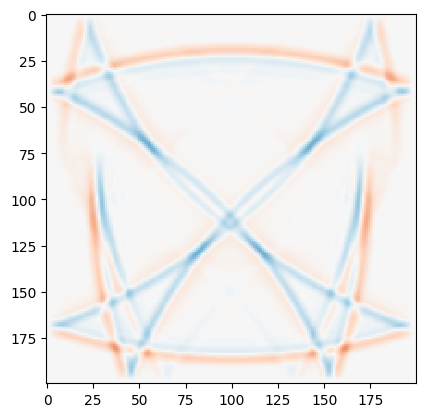

In [40]:
cmax = c.max()
v = max([np.abs(src.min()), np.abs(src.max())])
fig, ax = plt.subplots()

# Initialize animated plot
image = ax.imshow(sol[0,:,:], interpolation='nearest', vmin=-v, vmax=+v, cmap=plt.cm.RdBu)


# Update the plot for each frame
def update(frame):
    image.set_data(sol[frame,:,:])

    return image,

def init():
    image.set_data(sol[0,:,:])
    return image,


# Create the animation
ani = FuncAnimation(fig, update, frames=range(nt), init_func=init, blit=True, interval = 50)
# To display the animation in a Jupyter notebook
from IPython.display import HTML
HTML(ani.to_html5_video())

## Parte 2: Topografía y propagación de ondas sísmicas

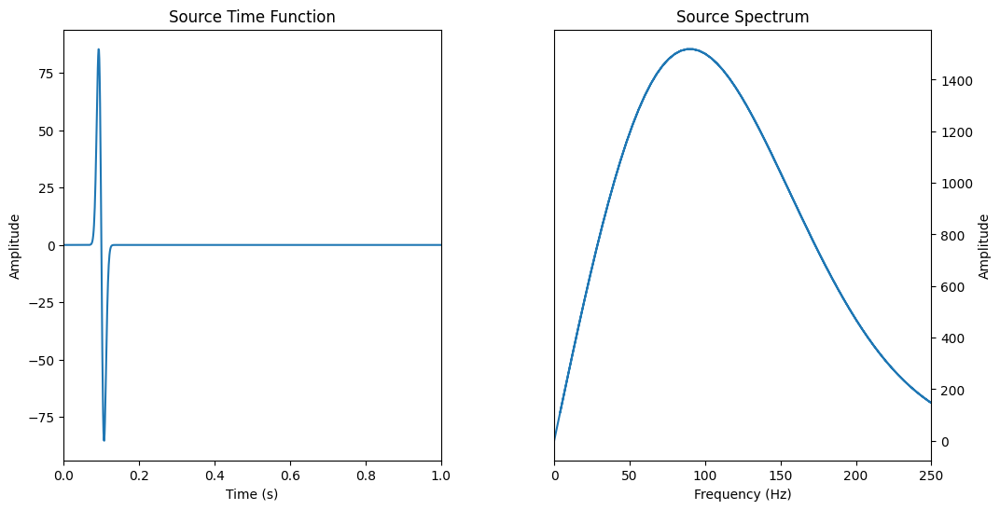

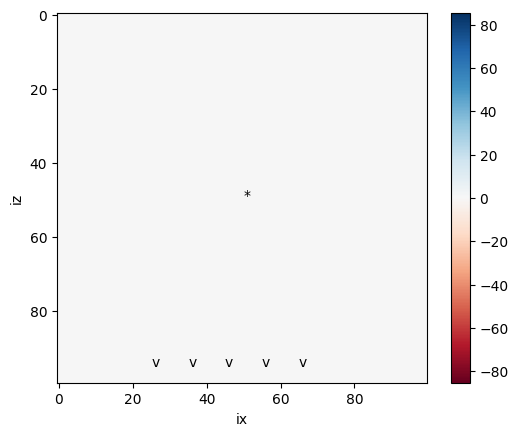

Max P: 0.00
Max P: 455.14
Max P: 111.42
Max P: 112.67
Max P: 172.85
Max P: 149.22
Max P: 144.55
Max P: 128.17
Max P: 101.36
Max P: 139.17


In [11]:
# Diferencias finitas propagacion de ondas 2-D
nx = 100      # numero de puntos en x
nz = 100      # numero de puntos en z
nt = 1000     # pasos de tiempo
dx = 9.0      # dx=dz en metros
dt = 0.001    # paso de tiempo secs
c0 = 1800.0   # velocidad medio m/s

# posiciones de la fuente
isx = int(nx // (100 / 50))  # indice en x
isz = int(nz // (100 / 50))  # indice z
ist = 100     #  shift funcion de tiempo
f0 = 100.0     # frecuencia dominante (Hz)
T = 1.0 / f0  # periodo de tiempo

# La fuente es una ondícula con freq dominante 10 Hz
# se implementa como la primera derivada de una gaussiana
src = np.empty(nt + 1)
for it in range(nt):
    src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)
src = np.diff(src) / dt
src[nt - 1] = 0

time = np.linspace(0 * dt, nt * dt, nt)

plt.figure(figsize=(12, 6))
gs1 = gridspec.GridSpec(1, 2, width_ratios=[1, 1], hspace=0.3, wspace=0.3)

# Graficamos funcion fuente
ax1 = plt.subplot(gs1[0])
ax1.plot(time, src)
ax1.set_title('Source Time Function')
ax1.set_xlim(time[0], time[-1])
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Amplitude')

# Grafica el espectro de frecuencia
ax2 = plt.subplot(gs1[1])
spec = np.fft.fft(src)
freq = np.fft.fftfreq(spec.size, d=dt / 4.)
ax2.plot(np.abs(freq), np.abs(spec))
ax2.set_xlim(0, 250)  # frecuencias 0 a 250 Hz
ax2.set_title('Source Spectrum')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Amplitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
plt.show()

# Posiciones de los receptores
irx = np.array([25, 35, 45, 55, 65])
irz = np.array([95, 95, 95, 95, 95])  # Ajustado
seis = np.zeros((len(irx), nt))

# Inicializamos variables
p = np.zeros((nz, nx))
pold = np.zeros((nz, nx))
pnew = np.zeros((nz, nx))
pxx = np.zeros((nz, nx))
pzz = np.zeros((nz, nx))

# Velocidad del medio - creación de las regiones con curva (montaña)
c = np.zeros((nz, nx))

# Crear el espacio computacional para las velocidades
c[0:10, :] = 0 * c0           # Sin propagación (0 m/s)
c[40:80, :] = c0 + 200        # Velocidad de 2000 m/s
c[80:100, :] = c0 + 1000      # Velocidad de 2800 m/s

# Definir la nueva curva
size = nx  # Ajuste del tamaño a nx
x = np.arange(size)
curve = 41 + 32 * np.sin(2 * np.pi * x / size)  # Ajustar los parámetros de la curva

# Rellenar la zona curva dentro del rango de 10 a 40 en y
for i in range(size):
    y_curve = int(curve[i])
    if y_curve > 0:  # Asegurar que no se salga de los límites
        c[y_curve:40, i] = c0  # Asignar la velocidad dentro de la curva

cmax = c.max()
v = max([np.abs(src.min()), np.abs(src.max())])

# Initialize animated plot
plt.imshow(pnew, interpolation='nearest',vmin=-v, vmax=+v, cmap=plt.cm.RdBu)

# Plot the receivers
for x, z in zip(irx, irz):
    plt.text(x, z, "v")

plt.text(isx, isz, '*')
plt.colorbar()
plt.xlabel('ix')
plt.ylabel('iz')


plt.ion()
plt.show()

# Inicialización para la animación
pt_zx = np.zeros((nt, nz, nx))

# Propagación en dominio temporal
isnap = 100
for it in range(nt):
    pt_zx[it, :, :] = p[:, :]

    # Aplicamos diferencias finitas para cálculo de derivadas parciales (esquema de 5 puntos)
    for i in range(2, nx - 2):
        pxx[:, i] = (-p[:, i + 2] + 16 * p[:, i + 1] - 30 * p[:, i] + 16 * p[:, i - 1] - p[:, i - 2]) / (12 * dx ** 2)
    for j in range(2, nz - 2):
        pzz[j, :] = (-p[j + 2, :] + 16 * p[j + 1, :] - 30 * p[j, :] + 16 * p[j - 1, :] - p[j - 2, :]) / (12 * dx ** 2)

    # Avanzamos en el tiempo
    pnew = 2 * p - pold + dt ** 2 * c ** 2 * (pxx + pzz)
    pnew[isz, isx] += src[it]  # Añadimos término fuente

    # Actualizar para el siguiente paso
    pold = p
    p = pnew

    # Guardar información de sensores
    seis[:, it] = p[irz, irx].flatten()

    # Mostrar evolución
    if it % isnap == 0:
        print("Max P: %.2f" % p.max())

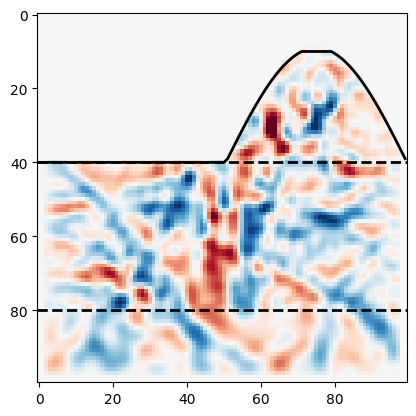

In [12]:
# Inicializa la animación
fig, ax = plt.subplots()
image = ax.imshow(pt_zx[0, :, :], interpolation='nearest', vmin=-v, vmax=+v, cmap=plt.cm.RdBu)

# Agregar una línea horizontal para delimitar los cambios de medio
ax.axhline(y=40, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=40
ax.axhline(y=80, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=80

# Definir la curva solo entre y=40 y y=10
curve_x = np.arange(size)
curve_y = 41 + 32 * np.sin(2 * np.pi * curve_x / size)

# Limitar la curva solo entre y=40 y y=10 (es decir, no bajar de 40)
curve_y = np.clip(curve_y, 10, 40)

# Agregar la curva
ax.plot(curve_x, curve_y, color='black', linestyle='-', linewidth=2)  # Línea de la curva, limitada entre y=10 y y=40

# Funciones de actualización
def update(frame):
    image.set_data(pt_zx[frame, :, :])
    return image,

def init():
    image.set_data(pt_zx[0, :, :])
    return image,

# Crear la animación
ani = FuncAnimation(fig, update, frames=range(nt), init_func=init, blit=True, interval=50)

# Mostrar la animación en el Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_html5_video())


## ¿Qué pasa si cambiamos la ubicación de la fuente?

### Ubicando la fuente en la cima de la montaña






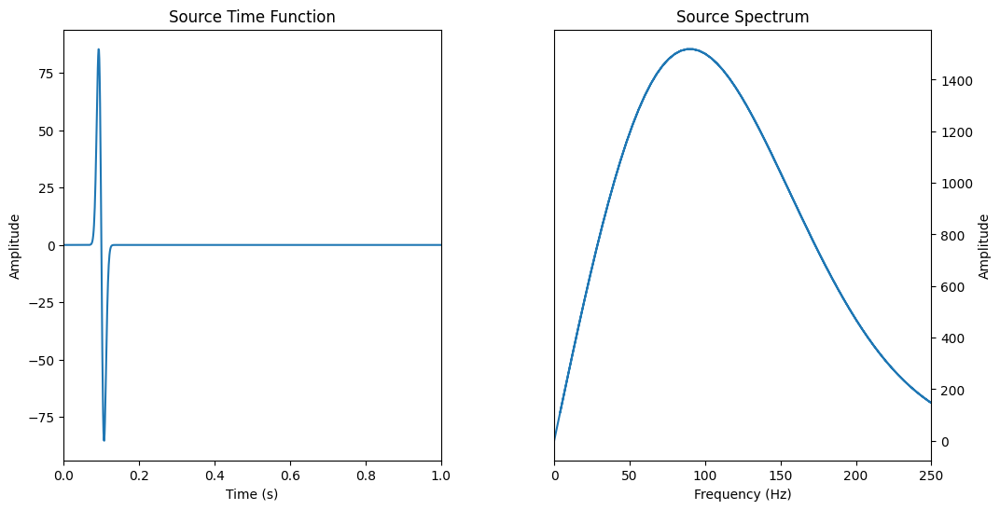

In [25]:
# Diferencias finitas propagacion de ondas 2-D
nx = 100      # numero de puntos en x
nz = 100      # numero de puntos en z
nt = 1000     # pasos de tiempo
dx = 9.0      # dx=dz en metros
dt = 0.001    # paso de tiempo secs
c0 = 1800.0   # velocidad medio m/s

# posiciones de la fuente
isx = int(nx // (100 / 77))  # indice en x
isz = int(nz // (100 / 10))  # indice z
ist = 100     #  shift funcion de tiempo
f0 = 100.0     # frecuencia dominante (Hz)
T = 1.0 / f0  # periodo de tiempo

# La fuente es una ondícula con freq dominante 10 Hz
# se implementa como la primera derivada de una gaussiana
src = np.empty(nt + 1)
for it in range(nt):
    src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)
src = np.diff(src) / dt
src[nt - 1] = 0

time = np.linspace(0 * dt, nt * dt, nt)

plt.figure(figsize=(12, 6))
gs1 = gridspec.GridSpec(1, 2, width_ratios=[1, 1], hspace=0.3, wspace=0.3)

# Graficamos funcion fuente
ax1 = plt.subplot(gs1[0])
ax1.plot(time, src)
ax1.set_title('Source Time Function')
ax1.set_xlim(time[0], time[-1])
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Amplitude')

# Grafica el espectro de frecuencia
ax2 = plt.subplot(gs1[1])
spec = np.fft.fft(src)
freq = np.fft.fftfreq(spec.size, d=dt / 4.)
ax2.plot(np.abs(freq), np.abs(spec))
ax2.set_xlim(0, 250)  # frecuencias 0 a 250 Hz
ax2.set_title('Source Spectrum')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Amplitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
plt.show()

# Posiciones de los receptores
irx = np.array([25, 35, 45, 55, 65])
irz = np.array([95, 95, 95, 95, 95])  # Ajustado
seis = np.zeros((len(irx), nt))

# Inicializamos variables
p = np.zeros((nz, nx))
pold = np.zeros((nz, nx))
pnew = np.zeros((nz, nx))
pxx = np.zeros((nz, nx))
pzz = np.zeros((nz, nx))

# Velocidad del medio - creación de las regiones con curva (montaña)
c = np.zeros((nz, nx))

# Crear el espacio computacional para las velocidades
c[0:10, :] = 0 * c0           # Sin propagación (0 m/s)
c[40:80, :] = c0 + 200        # Velocidad de 2000 m/s
c[80:100, :] = c0 + 1000      # Velocidad de 2800 m/s

# Definir la nueva curva
size = nx  # Ajuste del tamaño a nx
x = np.arange(size)
curve = 41 + 32 * np.sin(2 * np.pi * x / size)  # Ajustar los parámetros de la curva

# Rellenar la zona curva dentro del rango de 10 a 40 en y
for i in range(size):
    y_curve = int(curve[i])
    if y_curve > 0:  # Asegurar que no se salga de los límites
        c[y_curve:40, i] = c0  # Asignar la velocidad dentro de la curva

cmax = c.max()
v = max([np.abs(src.min()), np.abs(src.max())])


# Propagación en dominio temporal
isnap = 100
for it in range(nt):
    pt_zx[it, :, :] = p[:, :]

    # Aplicamos diferencias finitas para cálculo de derivadas parciales (esquema de 5 puntos)
    for i in range(2, nx - 2):
        pxx[:, i] = (-p[:, i + 2] + 16 * p[:, i + 1] - 30 * p[:, i] + 16 * p[:, i - 1] - p[:, i - 2]) / (12 * dx ** 2)
    for j in range(2, nz - 2):
        pzz[j, :] = (-p[j + 2, :] + 16 * p[j + 1, :] - 30 * p[j, :] + 16 * p[j - 1, :] - p[j - 2, :]) / (12 * dx ** 2)

    # Avanzamos en el tiempo
    pnew = 2 * p - pold + dt ** 2 * c ** 2 * (pxx + pzz)
    pnew[isz, isx] += src[it]  # Añadimos término fuente

    # Actualizar para el siguiente paso
    pold = p
    p = pnew

    # Guardar información de sensores
    seis[:, it] = p[irz, irx].flatten()



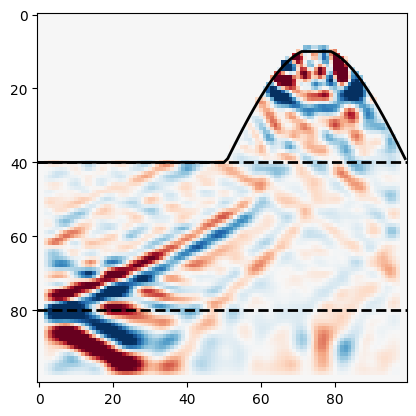

In [18]:
# Inicializa la animación
fig, ax = plt.subplots()
image = ax.imshow(pt_zx[0, :, :], interpolation='nearest', vmin=-v, vmax=+v, cmap=plt.cm.RdBu)

# Agregar una línea horizontal para delimitar los cambios de medio
ax.axhline(y=40, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=40
ax.axhline(y=80, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=80

# Definir la curva solo entre y=40 y y=10
curve_x = np.arange(size)
curve_y = 41 + 32 * np.sin(2 * np.pi * curve_x / size)

# Limitar la curva solo entre y=40 y y=10 (es decir, no bajar de 40)
curve_y = np.clip(curve_y, 10, 40)

# Agregar la curva
ax.plot(curve_x, curve_y, color='black', linestyle='-', linewidth=2)  # Línea de la curva, limitada entre y=10 y y=40

# Funciones de actualización
def update(frame):
    image.set_data(pt_zx[frame, :, :])
    return image,

def init():
    image.set_data(pt_zx[0, :, :])
    return image,

# Crear la animación
ani = FuncAnimation(fig, update, frames=range(nt), init_func=init, blit=True, interval=50)

# Mostrar la animación en el Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_html5_video())


### Ubicando la fuente en la capa inferior del subsuelo

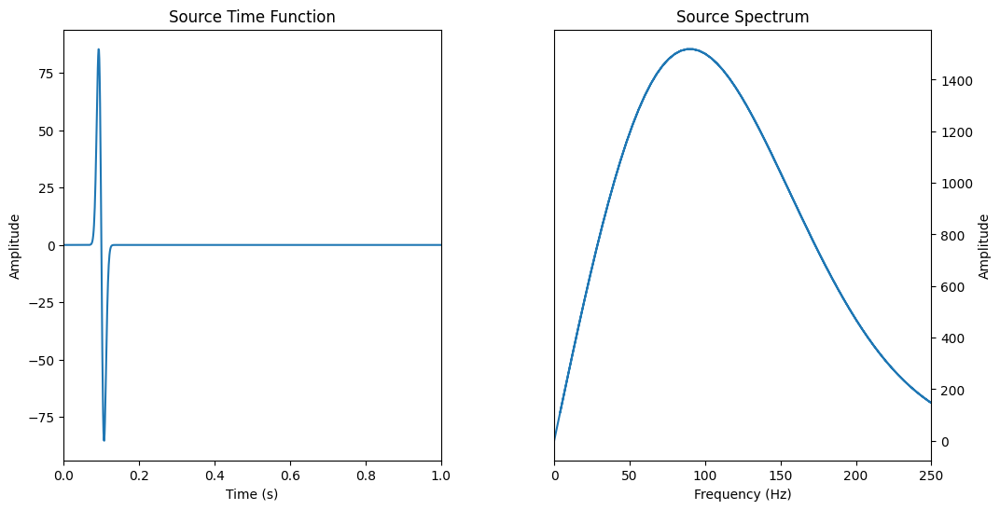

In [23]:
# posiciones de la fuente
isx = int(nx // (100 / 50))  # indice en x
isz = int(nz // (100 / 90))  # indice z
ist = 100     #  shift funcion de tiempo
f0 = 100.0     # frecuencia dominante (Hz)
T = 1.0 / f0  # periodo de tiempo

# La fuente es una ondícula con freq dominante 10 Hz
# se implementa como la primera derivada de una gaussiana
src = np.empty(nt + 1)
for it in range(nt):
    src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)
src = np.diff(src) / dt
src[nt - 1] = 0

time = np.linspace(0 * dt, nt * dt, nt)

plt.figure(figsize=(12, 6))
gs1 = gridspec.GridSpec(1, 2, width_ratios=[1, 1], hspace=0.3, wspace=0.3)

# Graficamos funcion fuente
ax1 = plt.subplot(gs1[0])
ax1.plot(time, src)
ax1.set_title('Source Time Function')
ax1.set_xlim(time[0], time[-1])
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Amplitude')

# Grafica el espectro de frecuencia
ax2 = plt.subplot(gs1[1])
spec = np.fft.fft(src)
freq = np.fft.fftfreq(spec.size, d=dt / 4.)
ax2.plot(np.abs(freq), np.abs(spec))
ax2.set_xlim(0, 250)  # frecuencias 0 a 250 Hz
ax2.set_title('Source Spectrum')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Amplitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
plt.show()

# Posiciones de los receptores
irx = np.array([25, 35, 45, 55, 65])
irz = np.array([95, 95, 95, 95, 95])  # Ajustado
seis = np.zeros((len(irx), nt))

# Inicializamos variables
p = np.zeros((nz, nx))
pold = np.zeros((nz, nx))
pnew = np.zeros((nz, nx))
pxx = np.zeros((nz, nx))
pzz = np.zeros((nz, nx))

# Velocidad del medio - creación de las regiones con curva (montaña)
c = np.zeros((nz, nx))

# Crear el espacio computacional para las velocidades
c[0:10, :] = 0 * c0           # Sin propagación (0 m/s)
c[40:80, :] = c0 + 200        # Velocidad de 2000 m/s
c[80:100, :] = c0 + 1000      # Velocidad de 2800 m/s

# Definir la nueva curva
size = nx  # Ajuste del tamaño a nx
x = np.arange(size)
curve = 41 + 32 * np.sin(2 * np.pi * x / size)  # Ajustar los parámetros de la curva

# Rellenar la zona curva dentro del rango de 10 a 40 en y
for i in range(size):
    y_curve = int(curve[i])
    if y_curve > 0:  # Asegurar que no se salga de los límites
        c[y_curve:40, i] = c0  # Asignar la velocidad dentro de la curva

cmax = c.max()
v = max([np.abs(src.min()), np.abs(src.max())])




# Propagación en dominio temporal
isnap = 100
for it in range(nt):
    pt_zx[it, :, :] = p[:, :]

    # Aplicamos diferencias finitas para cálculo de derivadas parciales (esquema de 5 puntos)
    for i in range(2, nx - 2):
        pxx[:, i] = (-p[:, i + 2] + 16 * p[:, i + 1] - 30 * p[:, i] + 16 * p[:, i - 1] - p[:, i - 2]) / (12 * dx ** 2)
    for j in range(2, nz - 2):
        pzz[j, :] = (-p[j + 2, :] + 16 * p[j + 1, :] - 30 * p[j, :] + 16 * p[j - 1, :] - p[j - 2, :]) / (12 * dx ** 2)

    # Avanzamos en el tiempo
    pnew = 2 * p - pold + dt ** 2 * c ** 2 * (pxx + pzz)
    pnew[isz, isx] += src[it]  # Añadimos término fuente

    # Actualizar para el siguiente paso
    pold = p
    p = pnew

    # Guardar información de sensores
    seis[:, it] = p[irz, irx].flatten()

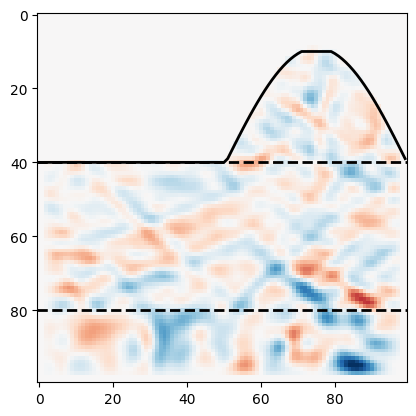

In [24]:
# Inicializa la animación
fig, ax = plt.subplots()
image = ax.imshow(pt_zx[0, :, :], interpolation='nearest', vmin=-v, vmax=+v, cmap=plt.cm.RdBu)

# Agregar una línea horizontal para delimitar los cambios de medio
ax.axhline(y=40, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=40
ax.axhline(y=80, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=80

# Definir la curva solo entre y=40 y y=10
curve_x = np.arange(size)
curve_y = 41 + 32 * np.sin(2 * np.pi * curve_x / size)

# Limitar la curva solo entre y=40 y y=10 (es decir, no bajar de 40)
curve_y = np.clip(curve_y, 10, 40)

# Agregar la curva
ax.plot(curve_x, curve_y, color='black', linestyle='-', linewidth=2)  # Línea de la curva, limitada entre y=10 y y=40

# Funciones de actualización
def update(frame):
    image.set_data(pt_zx[frame, :, :])
    return image,

def init():
    image.set_data(pt_zx[0, :, :])
    return image,

# Crear la animación
ani = FuncAnimation(fig, update, frames=range(nt), init_func=init, blit=True, interval=50)

# Mostrar la animación en el Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_html5_video())


### Ubicando la fuente en la zona plana junto a la montaña



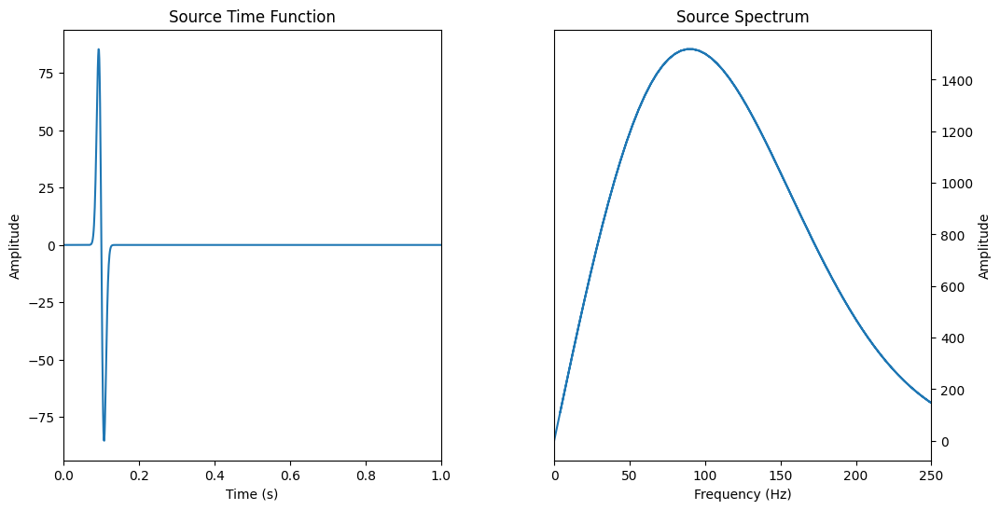

In [26]:
# posiciones de la fuente
isx = int(nx // (100 / 30))  # indice en x
isz = int(nz // (100 / 40))  # indice z
ist = 100     #  shift funcion de tiempo
f0 = 100.0     # frecuencia dominante (Hz)
T = 1.0 / f0  # periodo de tiempo

# La fuente es una ondícula con freq dominante 10 Hz
# se implementa como la primera derivada de una gaussiana
src = np.empty(nt + 1)
for it in range(nt):
    src[it] = np.exp(-1.0 / T ** 2 * ((it - ist) * dt) ** 2)
src = np.diff(src) / dt
src[nt - 1] = 0

time = np.linspace(0 * dt, nt * dt, nt)

plt.figure(figsize=(12, 6))
gs1 = gridspec.GridSpec(1, 2, width_ratios=[1, 1], hspace=0.3, wspace=0.3)

# Graficamos funcion fuente
ax1 = plt.subplot(gs1[0])
ax1.plot(time, src)
ax1.set_title('Source Time Function')
ax1.set_xlim(time[0], time[-1])
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Amplitude')

# Grafica el espectro de frecuencia
ax2 = plt.subplot(gs1[1])
spec = np.fft.fft(src)
freq = np.fft.fftfreq(spec.size, d=dt / 4.)
ax2.plot(np.abs(freq), np.abs(spec))
ax2.set_xlim(0, 250)  # frecuencias 0 a 250 Hz
ax2.set_title('Source Spectrum')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Amplitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
plt.show()

# Posiciones de los receptores
irx = np.array([25, 35, 45, 55, 65])
irz = np.array([95, 95, 95, 95, 95])  # Ajustado
seis = np.zeros((len(irx), nt))

# Inicializamos variables
p = np.zeros((nz, nx))
pold = np.zeros((nz, nx))
pnew = np.zeros((nz, nx))
pxx = np.zeros((nz, nx))
pzz = np.zeros((nz, nx))

# Velocidad del medio - creación de las regiones con curva (montaña)
c = np.zeros((nz, nx))

# Crear el espacio computacional para las velocidades
c[0:10, :] = 0 * c0           # Sin propagación (0 m/s)
c[40:80, :] = c0 + 200        # Velocidad de 2000 m/s
c[80:100, :] = c0 + 1000      # Velocidad de 2800 m/s

# Definir la nueva curva
size = nx  # Ajuste del tamaño a nx
x = np.arange(size)
curve = 41 + 32 * np.sin(2 * np.pi * x / size)  # Ajustar los parámetros de la curva

# Rellenar la zona curva dentro del rango de 10 a 40 en y
for i in range(size):
    y_curve = int(curve[i])
    if y_curve > 0:  # Asegurar que no se salga de los límites
        c[y_curve:40, i] = c0  # Asignar la velocidad dentro de la curva

cmax = c.max()
v = max([np.abs(src.min()), np.abs(src.max())])

# Propagación en dominio temporal
isnap = 100
for it in range(nt):
    pt_zx[it, :, :] = p[:, :]

    # Aplicamos diferencias finitas para cálculo de derivadas parciales (esquema de 5 puntos)
    for i in range(2, nx - 2):
        pxx[:, i] = (-p[:, i + 2] + 16 * p[:, i + 1] - 30 * p[:, i] + 16 * p[:, i - 1] - p[:, i - 2]) / (12 * dx ** 2)
    for j in range(2, nz - 2):
        pzz[j, :] = (-p[j + 2, :] + 16 * p[j + 1, :] - 30 * p[j, :] + 16 * p[j - 1, :] - p[j - 2, :]) / (12 * dx ** 2)

    # Avanzamos en el tiempo
    pnew = 2 * p - pold + dt ** 2 * c ** 2 * (pxx + pzz)
    pnew[isz, isx] += src[it]  # Añadimos término fuente

    # Actualizar para el siguiente paso
    pold = p
    p = pnew

    # Guardar información de sensores
    seis[:, it] = p[irz, irx].flatten()

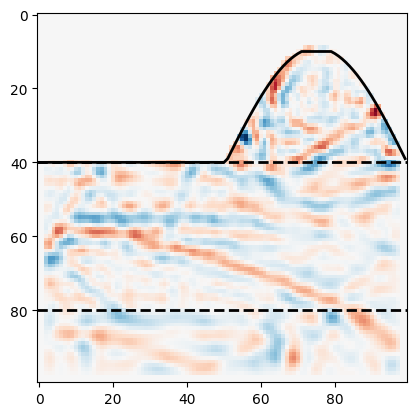

In [27]:
# Inicializa la animación
fig, ax = plt.subplots()
image = ax.imshow(pt_zx[0, :, :], interpolation='nearest', vmin=-v, vmax=+v, cmap=plt.cm.RdBu)

# Agregar una línea horizontal para delimitar los cambios de medio
ax.axhline(y=40, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=40
ax.axhline(y=80, color='black', linestyle='--', linewidth=2)  # Línea horizontal en y=80

# Definir la curva solo entre y=40 y y=10
curve_x = np.arange(size)
curve_y = 41 + 32 * np.sin(2 * np.pi * curve_x / size)

# Limitar la curva solo entre y=40 y y=10 (es decir, no bajar de 40)
curve_y = np.clip(curve_y, 10, 40)

# Agregar la curva
ax.plot(curve_x, curve_y, color='black', linestyle='-', linewidth=2)  # Línea de la curva, limitada entre y=10 y y=40

# Funciones de actualización
def update(frame):
    image.set_data(pt_zx[frame, :, :])
    return image,

def init():
    image.set_data(pt_zx[0, :, :])
    return image,

# Crear la animación
ani = FuncAnimation(fig, update, frames=range(nt), init_func=init, blit=True, interval=50)

# Mostrar la animación en el Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_html5_video())